Importing the csv containing all info related to Utrecht borough and districts, with the purpose of plotting them with Folium

In [1]:
import numpy as np
import pandas as pd

In [62]:
df=pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/utrecht_postcode_v1.csv")
df.head()

,Postcode_Number,District,District_latitude,District_longitue,Neighbourhood,Neigh_latitude,Neigh_longitude,Zipcode,Street,Latitude,Longitude
0,3981,Wijk 00 Bunnik,52.061679,5.185625,Bunnik,52.06807,5.201628,3981ZR,Vletweide,52.072374,5.189571
1,3981,Wijk 00 Bunnik,52.061679,5.185625,Bunnik,52.06807,5.201628,3981ZP,Vletweide,52.072450,5.190038
2,3981,Wijk 00 Bunnik,52.061679,5.185625,Bunnik,52.06807,5.201628,3981ZN,Vletweide,52.072639,5.190439
3,3981,Wijk 00 Bunnik,52.061679,5.185625,Bunnik,52.06807,5.201628,3981ZM,Vletweide,52.072933,5.190738
4,3981,Wijk 00 Bunnik,52.061679,5.185625,Bunnik,52.06807,5.201628,3981ZL,Vletweide,52.073043,5.191319


In [41]:
df=pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/utrecht_postcode_v1.csv")
df['District_code'] = df.District.str.extract(r'(\d+)', expand=False)
df['District'] = df.District.str.replace('Wijk', '', regex=False)
df['District'] = df.District.str.replace('(\d+)', '', regex=True)
df=df[['District_code','District','Neighbourhood','Zipcode','Street','Latitude','Longitude']]
df['District_code'] = pd.to_numeric(df['District_code'])
df.head()

,District_code,District,Neighbourhood,Zipcode,Street,Latitude,Longitude
0,0,Bunnik,Bunnik,3981ZR,Vletweide,52.072374,5.189571
1,0,Bunnik,Bunnik,3981ZP,Vletweide,52.072450,5.190038
2,0,Bunnik,Bunnik,3981ZN,Vletweide,52.072639,5.190439
3,0,Bunnik,Bunnik,3981ZM,Vletweide,52.072933,5.190738
4,0,Bunnik,Bunnik,3981ZL,Vletweide,52.073043,5.191319


In [68]:
df.dtypes

District_code      int64
District          object
Neighbourhood     object
Zipcode           object
Street            object
Latitude         float64
Longitude        float64
dtype: object

In [7]:
import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
# import k-means from clustering stage
#from sklearn.cluster import KMeans
#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
#import folium # map rendering library

print('Libraries imported.')

Libraries imported.


In [5]:
latitude = 52.09083
longitude = 5.12222
print('The geograpical coordinate of Utrecht are {}, {}.'.format(latitude, longitude))# create map of Utrecht using latitude and longitude values

map_utr = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the neighbourhood
ks=len(df.District_code.unique())
x = np.arange(ks)
ys = [i + x + (i*x)**2 for i in range(ks)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to map
for lat, lng, neighborhood, street, dc in zip(df['Latitude'], df['Longitude'], df['District'], df['Street'],df['District_code']):
    label = '{}, {}'.format(street, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[dc],
        fill=True,
        fill_color=rainbow[dc],
        fill_opacity=0.7,
        parse_html=False).add_to(map_utr)  
    
map_utr

The geograpical coordinate of Utrecht are 52.09083, 5.12222.


Importing the csv containing all info related to Utrecht central borough and districts

In [3]:
dfrc=pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/rental_central.csv")

dfrc['District_code'] = dfrc.District.str.extract(r'(\d+)', expand=False)
dfrc['District'] = dfrc.District.str.replace('Wijk', '', regex=False)
dfrc['District'] = dfrc.District.str.replace('(\d+)', '', regex=True)

dfrc=dfrc[['District_code','District','Postcode','Street','SLatitude','SLongitude','Type','Size','Rooms','Furnished','Rent']]
dfrc.rename(columns={"Postcode": "Zipcode"},inplace=True)

#dfrc.set_index('Zipcode',inplace=True)
dfrc.head()

,District_code,District,Zipcode,Street,SLatitude,SLongitude,Type,Size,Rooms,Furnished,Rent
0,04,Noordoost,3514EK,Bellamystraat,52.097603,5.118972,Apartment,124,3,furnished,3250
1,04,Noordoost,3572ZP,Buys Ballotstraat,52.096737,5.139917,Apartment,80,2,upholstered,2250
2,04,Noordoost,3572ZP,Buys Ballotstraat,52.096737,5.139917,Apartment,80,2,furnished,1745
3,04,Noordoost,3572XN,M.A. de Ruyterstraat,52.100593,5.135937,Apartment,169,4,upholstered,2500
4,04,Noordoost,3572SR,Bouwstraat,52.097246,5.129889,House,64,3,furnished,1595


In [5]:
df_clo=dfrc.groupby(['District']).mean()
df_clo.reset_index(inplace=True)
df_clo=df_clo[['District','Rent']]
#df_clo['District'] = df_clo['District'].str.upper()
df_clo

,District,Rent
0,Binnenstad,1792.281250
1,Noordoost,1763.558824
2,Oost,1739.186047
3,Zuid,1562.142857
4,Zuidwest,1397.689655


In [6]:
latitude = 52.09083
longitude = 5.12222
print('The geograpical coordinate of Utrecht are {}, {}.'.format(latitude, longitude))# create map of Utrecht using latitude and longitude values

utrecht_geo = r'https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/wijk_.geojson'

# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(df_clo['Rent'].min(),
                              df_clo['Rent'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
map_utr = folium.Map(location=[latitude, longitude], zoom_start=2, tiles='Mapbox Bright')
map_utr.choropleth(
    geo_data=utrecht_geo,
    data=df_clo,
    columns=['District', 'Rent'],
    key_on='feature.properties.NAAM',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Price in Utrecht by Wijk',
    reset=True
)
map_utr

The geograpical coordinate of Utrecht are 52.09083, 5.12222.


DATA WRANGLING

In order to evaluate effect on price of main variables (Area, House, Type, House Size, Room numbers, Furnished) the analysis is carried out.

Firstly, the location area is evaluated with Foursquare API.

In [2]:
dfrc=pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/rental_central.csv")

dfrc['District_code'] = dfrc.District.str.extract(r'(\d+)', expand=False)
dfrc['District'] = dfrc.District.str.replace('Wijk', '', regex=False)
dfrc['District'] = dfrc.District.str.replace('(\d+)', '', regex=True)

dfrc=dfrc[['District_code','District','Postcode','Street','SLatitude','SLongitude','Type','Size','Rooms','Furnished','Rent']]
dfrc.rename(columns={"Postcode": "Zipcode"},inplace=True)

dfrc_ = dfrc.replace({'Type': {'Apartment': 0, 'House': 1, 'Studio':2,'Villa':3}})
dfrc_ = dfrc_.replace({'Furnished': {'furnished': 0, 'upholstered': 1, 'shell':2}})

#dfrc.set_index('Zipcode',inplace=True)
dfrc_.head()

,District_code,District,Zipcode,Street,SLatitude,SLongitude,Type,Size,Rooms,Furnished,Rent
0,04,Noordoost,3514EK,Bellamystraat,52.097603,5.118972,0,124,3,0,3250
1,04,Noordoost,3572ZP,Buys Ballotstraat,52.096737,5.139917,0,80,2,1,2250
2,04,Noordoost,3572ZP,Buys Ballotstraat,52.096737,5.139917,0,80,2,0,1745
3,04,Noordoost,3572XN,M.A. de Ruyterstraat,52.100593,5.135937,0,169,4,1,2500
4,04,Noordoost,3572SR,Bouwstraat,52.097246,5.129889,1,64,3,0,1595


In [3]:
#grouping elements per house in the same street
dfrcc=dfrc_.groupby(['Street']).mean()
dfrcc.reset_index(inplace=True)
dfrcc.head()

,Street,SLatitude,SLongitude,Type,Size,Rooms,Furnished,Rent
0,2e Buurkerksteeg,52.090624,5.118588,0.0,110.000000,2.000000,1.000000,1850.000000
1,3e Buurkerksteeg,52.090371,5.118641,0.0,77.500000,1.000000,0.500000,1340.000000
2,Abstederdijk,52.083581,5.129972,1.0,75.000000,2.000000,0.000000,1250.000000
3,Achter St.-Pieter,52.091320,5.123550,0.0,50.285714,1.571429,0.285714,2457.142857
4,Adelaarstraat,52.099574,5.117364,0.0,75.000000,2.000000,0.000000,1495.000000


In [52]:
dfrcc.shape

(125, 7)

In [4]:
CLIENT_ID = 'IFUAXALYJK3F4XL3T3M2SLCYDXJVDFZKNRR4XU5FG22WTFJG' # your Foursquare ID
CLIENT_SECRET = 'HAXDDXAB5GDBBWLO4KADTVNAY3WEMTIS5PTTQDPLEYH0SL4Z' # your Foursquare Secret
VERSION = '20200104' # Foursquare API version
radius=500
LIMIT=100


print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: IFUAXALYJK3F4XL3T3M2SLCYDXJVDFZKNRR4XU5FG22WTFJG
CLIENT_SECRET:HAXDDXAB5GDBBWLO4KADTVNAY3WEMTIS5PTTQDPLEYH0SL4Z


In [5]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [8]:
utr_venues = getNearbyVenues(names=dfrcc['Street'],
                                   latitudes=dfrcc['SLatitude'],
                                   longitudes=dfrcc['SLongitude']
                                  )
utr_venues.head()

2e Buurkerksteeg
3e Buurkerksteeg
Abstederdijk
Achter St.-Pieter
Adelaarstraat
Adriaanstraat
Adriaen van Ostadelaan
Agnietenstraat
Albert van Dalsumlaan
Alkhof
Andreashof
Arthur van Schendelstraat
Aziëlaan
Barnsteenlaan
Bellamystraat
Bernadottelaan
Biltstraat
Bolstraat
Bouwstraat
Briljantlaan
Buurkerkhof
Buys Ballotstraat
Carry van Bruggenstraat
Croeselaan
De Vooysplantsoen
Detmoldstraat
Domstraat
Dr. H.J. Lovinklaan
Duifstraat
Eligenhof
Emmalaan
Gansstraat
Geertekerkhof
Geertestraat
Gerard Noodtstraat
Griftstraat
Groenestraat
Groenmarktstraat
Hartingstraat
Heemstedelaan
Henriëtte Roland Holststraat
Herculeslaan
Hollandse Toren
Homeruslaan
Huizingalaan
Ina Boudier-Bakkerlaan
Jacob van der Borchstraat
Jacobijnenstraat
Jan van den Doemstraat
Janskerkhof
Jansveld
Jeruzalemstraat
Johan van Oldenbarneveltlaan
Justus van Effenstraat
Jutfaseweg
Kerkstraat
Korte Jansstraat
Korte Jufferstraat
Lamérislaan
Lange Jufferstraat
Lange Nieuwstraat
Lange Smeestraat
Livingstonelaan
Loderlaan
M.A. de Ruy

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,2e Buurkerksteeg,52.090624,5.118588,Domtoren,52.090762,5.121324,Monument / Landmark
1,2e Buurkerksteeg,52.090624,5.118588,Beers & Barrels,52.091938,5.116894,American Restaurant
2,2e Buurkerksteeg,52.090624,5.118588,Belgisch Biercafé Olivier,52.090730,5.115754,Beer Bar
3,2e Buurkerksteeg,52.090624,5.118588,Frietwinkel,52.092173,5.117668,Snack Place
4,2e Buurkerksteeg,52.090624,5.118588,Restaurant San Siro,52.091578,5.120383,Italian Restaurant


In [9]:
from IPython.display import HTML
import base64

def create_download_link( df, title = "Download CSV file", filename = "data.csv"):  
    csv = df.to_csv()
    b64 = base64.b64encode(csv.encode())
    payload = b64.decode()
    html = '<a download="{filename}" href="data:text/csv;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)


%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.0.2


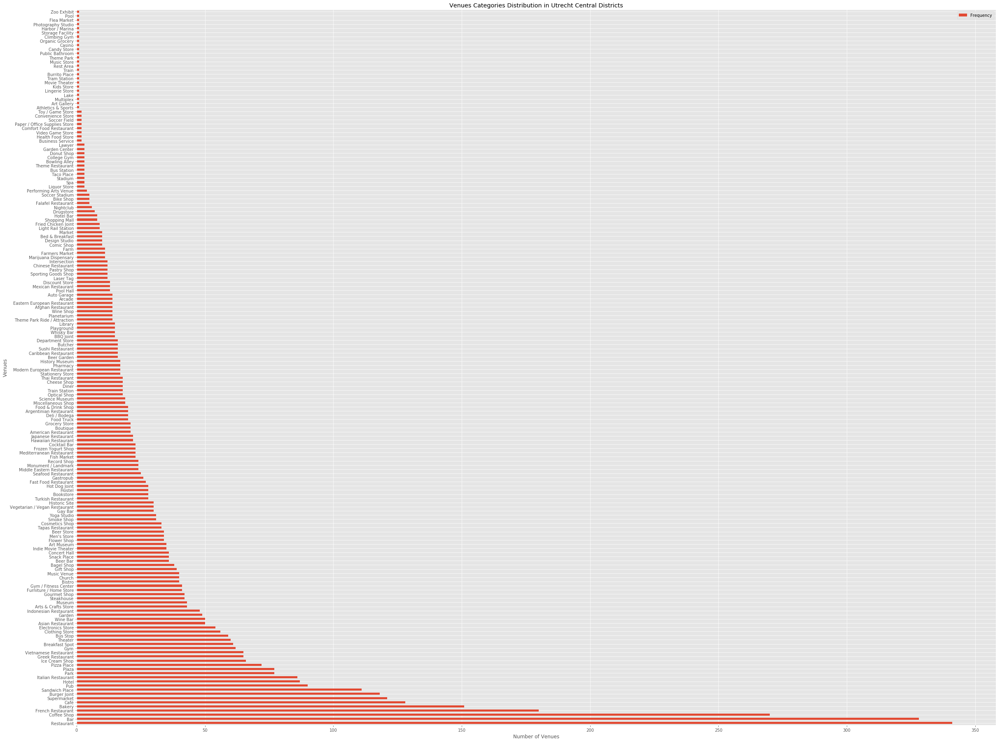

In [12]:
utr_venues.head()
#data preparation for the bar chart of venue categories
vai=utr_venues.groupby('Venue Category').count()
#vai.reset_index(inplace=True)
vai=vai[['Neighborhood']]
vai.rename(columns={"Neighborhood":"Frequency"},inplace=True)
vai=vai.sort_values(by=['Frequency'],ascending=False)
#count,bin_edges=np.histogram(vai['Frequency'])


vai.plot(kind='barh',figsize=(40,32))
plt.xlabel('Number of Venues') # add to x-label to the plot
plt.ylabel('Venues') # add y-label to the plot
plt.title('Venues Categories Distribution in Utrecht Central Districts') # add title to the plot
plt.show()

create_download_link(vai, title = "Download CSV file", filename = "data.csv")

In [10]:
#utr_venues = getNearbyVenues(names=dfrcc['Street'],
#                                   latitudes=dfrcc['SLatitude'],
#                                   longitudes=dfrcc['SLongitude']
#                                  )
rep= {
    'Restaurant':'Food Place',
    'Bar':'Drink Place',
    'Coffee Shop':'Drink Place',
    'French Restaurant':'Food Place',
    'Bakery':'Shop',
    'Café':'Drink Place',
    'Supermarket':'Shop',
    'Burger Joint':'Food Place',
    'Sandwich Place':'Food Place',
    'Pub':'Drink Place',
    'Hotel':'Lodging Place',
    'Italian Restaurant':'Food Place',
    'Bus Stop':'Transport Spot',
    'Plaza':'Entertainment Place',
    'Pizza Place':'Food Place',
    'Greek Restaurant':'Food Place',
    'Ice Cream Shop':'Food Place',
    'Vietnamese Restaurant':'Food Place',
    'Gym':'Entertainment Place',
    'Breakfast Spot':'Food Place',
    'Indonesian Restaurant':'Food Place',
    'Park':'Entertainment Place',
    'Theater':'Entertainment Place',
    'Museum':'Entertainment Place',
    'Clothing Store':'Shop',
    'Garden':'Entertainment Place',
    'Wine Bar':'Drink Place',
    'Asian Restaurant':'Food Place',
    'Cosmetics Shop':'Shop',
    'Bistro':'Food Place',
    'Electronics Store':'Shop',
    'Gym / Fitness Center':'Entertainment Place',
    'Bagel Shop':'Shop',
    'Arts & Crafts Store':'Shop',
    'Steakhouse':'Food Place',
    'Gourmet Shop':'Shop',
    'Music Venue':'Entertainment Place',
    'Church':'Entertainment Place',
    'Beer Bar':'Drink Place',
    'Snack Place':'Food Place',
    'Gift Shop':'Shop',
    'Flower Shop':'Shop',
    'Art Museum':'Entertainment Place',
    'Indie Movie Theater':'Entertainment Place',
    'Men Store':'Shop',
    'Beer Store':'Shop',
    'Tapas Restaurant':'Food Place',
    'Pharmacy':'Shop',
    'Yoga Studio':'Entertainment Place',
    'Furniture / Home Store':'Shop',
    'Gay Bar':'Drink Place',
    'Vegetarian / Vegan Restaurant':'Food Place',
    'Concert Hall':'Entertainment Place',
    'Smoke Shop':'Shop',
    'Hostel':'Lodging Place',
    'Bookstore':'Shop',
    'Turkish Restaurant':'Food Place',
    'Hot Dog Joint':'Food Place',
    'Mediterranean Restaurant':'Food Place',
    'Fast Food Restaurant':'Food Place',
    'Seafood Restaurant':'Food Place',
    'Gastropub':'Food Place',
    'Fish Market':'Shop',
    'Middle Eastern Restaurant':'Food Place',
    'Grocery Store':'Shop',
    'Historic Site':'Entertainment Place',
    'Record Shop':'Shop',
    'Monument / Landmark':'Entertainment Place',
    'Frozen Yogurt Shop':'Food Place',
    'Cocktail Bar':'Drink Place',
    'Japanese Restaurant':'Food Place',
    'Hawaiian Restaurant':'Food Place',
    'Playground':'Entertainment Place',
    'Boutique':'Shop',
    'Food & Drink Shop':'Shop',
    'Food Truck':'Food Place',
    'Deli / Bodega':'Food Place',
    'American Restaurant':'Food Place',
    'Argentinian Restaurant':'Food Place',
    'Arcade':'Entertainment Place',
    'Thai Restaurant':'Food Place',
    'Miscellaneous Shop':'Shop',
    'Science Museum':'Entertainment Place',
    'Diner':'Food Place',
    'Chinese Restaurant':'Food Place',
    'Cheese Shop':'Shop',
    'Train Station':'Transport Spot'
}

utr_venues_=utr_venues
utr_venues_['Venue Category']= [rep.get(n, n) for n in utr_venues['Venue Category']]

utr_venues_.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,2e Buurkerksteeg,52.090624,5.118588,Domtoren,52.090762,5.121324,Entertainment Place
1,2e Buurkerksteeg,52.090624,5.118588,Beers & Barrels,52.091938,5.116894,Food Place
2,2e Buurkerksteeg,52.090624,5.118588,Belgisch Biercafé Olivier,52.090730,5.115754,Drink Place
3,2e Buurkerksteeg,52.090624,5.118588,Frietwinkel,52.092173,5.117668,Food Place
4,2e Buurkerksteeg,52.090624,5.118588,Restaurant San Siro,52.091578,5.120383,Food Place


In [11]:
utr_venues_=utr_venues
utr_venues_f = utr_venues_.loc[((utr_venues['Venue Category']=='Food Place'))]
utr_venues_d = utr_venues_.loc[((utr_venues['Venue Category']=='Drink Place'))]
utr_venues_e = utr_venues_.loc[((utr_venues['Venue Category']=='Entertainment Place'))]
utr_venues_s = utr_venues_.loc[((utr_venues['Venue Category']=='Shop'))]
utr_venues_l = utr_venues_.loc[((utr_venues['Venue Category']=='Lodging Place'))]
utr_venues_tr = utr_venues_.loc[((utr_venues['Venue Category']=='Transport Spot'))]

utr_venues_=pd.concat([utr_venues_f,utr_venues_d,utr_venues_e,utr_venues_s,utr_venues_l,utr_venues_tr])

#utr_venues_.reset_index(inplace=True)
utr_venues_.sort_values(by=['Neighborhood'],ascending=True)

utr_venues_.head()
#print(len(utr_venues_))
#create_download_link(utr_venues_, title = "Download CSV file", filename = "data__.csv")

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1,2e Buurkerksteeg,52.090624,5.118588,Beers & Barrels,52.091938,5.116894,Food Place
3,2e Buurkerksteeg,52.090624,5.118588,Frietwinkel,52.092173,5.117668,Food Place
4,2e Buurkerksteeg,52.090624,5.118588,Restaurant San Siro,52.091578,5.120383,Food Place
10,2e Buurkerksteeg,52.090624,5.118588,Bigoli,52.092683,5.119249,Food Place
11,2e Buurkerksteeg,52.090624,5.118588,Yoghurt Barn,52.092431,5.118000,Food Place


In [12]:
a=pd.DataFrame(utr_venues_.groupby(['Venue Category','Neighborhood']).size())
a.reset_index(inplace=True)
a.rename(columns={"Neighborhood": "Street"},inplace=True)
a.head()

a_pivot = a.pivot(index='Street', columns='Venue Category', values=0)

a_pivot.reset_index(inplace=True)
a_pivot.sort_values(by=['Street'],ascending=True)
a_pivot=a_pivot.fillna(0)
a_pivot.columns.name = None 
#create_download_link(a, title = "Download CSV file", filename = "a.csv")

a_pivot['Street'] = a_pivot['Street'].astype(str)

a_pivot.head()

,Street,Drink Place,Entertainment Place,Food Place,Lodging Place,Shop,Transport Spot
0,2e Buurkerksteeg,18.0,10.0,41.0,3.0,20.0,0.0
1,3e Buurkerksteeg,18.0,11.0,42.0,3.0,18.0,0.0
2,Abstederdijk,6.0,7.0,6.0,0.0,9.0,0.0
3,Achter St.-Pieter,19.0,13.0,40.0,3.0,18.0,0.0
4,Adelaarstraat,0.0,2.0,5.0,1.0,1.0,1.0


In [106]:
a_pivot.reset_index(inplace=True)
a_pivot.dtypes

index                    int64
Street                  object
Drink Place            float64
Entertainment Place    float64
Food Place             float64
Lodging Place          float64
Shop                   float64
Transport Spot         float64
dtype: object

In [52]:
#dfrcc.reset_index(inplace=True)
dfrcc['Street'] = dfrcc['Street'].astype(str)
#Motor['Motor'] = Motor['Motor'].astype(str)

dfrcc.head()

,Street,SLatitude,SLongitude,Type,Size,Rooms,Furnished,Rent
0,2e Buurkerksteeg,52.090624,5.118588,0.0,110.000000,2.000000,1.000000,1850.000000
1,3e Buurkerksteeg,52.090371,5.118641,0.0,77.500000,1.000000,0.500000,1340.000000
2,Abstederdijk,52.083581,5.129972,1.0,75.000000,2.000000,0.000000,1250.000000
3,Achter St.-Pieter,52.091320,5.123550,0.0,50.285714,1.571429,0.285714,2457.142857
4,Adelaarstraat,52.099574,5.117364,0.0,75.000000,2.000000,0.000000,1495.000000


In [109]:
dfrcc.dtypes

index           int64
Street         object
SLatitude     float64
SLongitude    float64
Type          float64
Size          float64
Rooms         float64
Furnished     float64
Rent          float64
dtype: object

In [86]:
dfrcc.shape

(125, 8)

In [17]:
table=dfrcc.merge(a_pivot,how="left")
#in adjusting the columns, column type is eliminated as not provided significative infos
table=table[['Street','Size','Rooms','Furnished','Drink Place','Entertainment Place','Food Place','Lodging Place','Shop','Transport Spot','Rent']]
table.set_index('Street',inplace=True)
table = table.astype(int)
table.reset_index(inplace=True)
table.head()

create_download_link(table, title = "Download CSV file", filename = "table.csv")

EXPLORATORY DATA ANALYSIS

First, each variable is evaluated singularly

In [75]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.linear_model import Ridge

import seaborn as sns

In [2]:
table=pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/table.csv")

In [3]:
lm=LinearRegression()
Z=table[['Size']]
y=table[['Rent']]
lm.fit(Z,y)
yhat=lm.predict(Z)

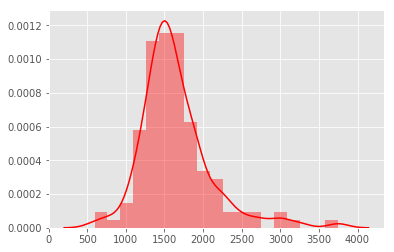

In [20]:
sns.distplot(y,hist=True,color='r')

,Size,Rent
Size,1.000000,0.595282
Rent,0.595282,1.000000


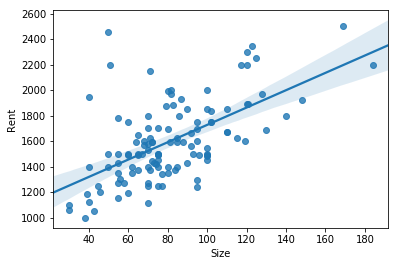

In [76]:
sns.regplot(x='Size',y='Rent',data=table)
#sns.residplot(Z,y)
table[['Size', 'Rent']].corr()

,Furnished,Rent
Furnished,1.000000,-0.123898
Rent,-0.123898,1.000000


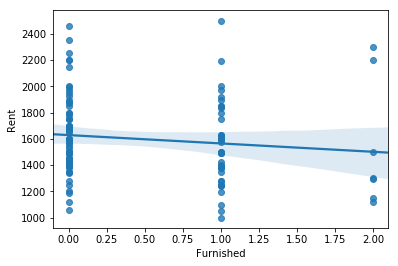

In [78]:
sns.regplot(x='Furnished',y='Rent',data=table)
table[['Furnished', 'Rent']].corr()

,Rooms,Rent
Rooms,1.000000,0.320405
Rent,0.320405,1.000000


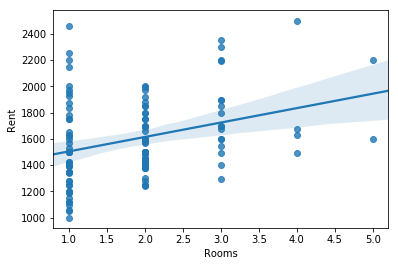

In [79]:
sns.regplot(x='Rooms',y='Rent',data=table)
table[['Rooms', 'Rent']].corr()

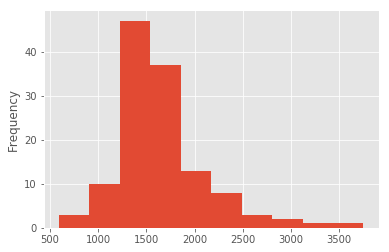

In [143]:
sns.barplot(x='Rooms',y='Rent',data=table)

,Food Place,Rent
Food Place,1.000000,0.263411
Rent,0.263411,1.000000


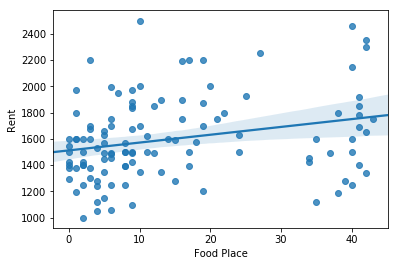

In [82]:
sns.regplot(x='Food Place',y='Rent',data=table)
table[['Food Place', 'Rent']].corr()

,Entertainment Place,Rent
Entertainment Place,1.000000,0.298294
Rent,0.298294,1.000000


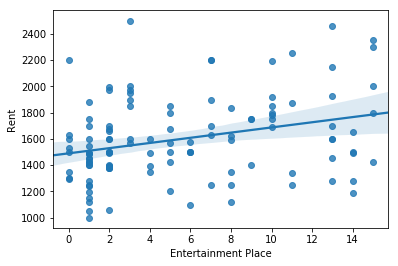

In [83]:
sns.regplot(x='Entertainment Place',y='Rent',data=table)
table[['Entertainment Place', 'Rent']].corr()

,Lodging Place,Rent
Lodging Place,1.000000,0.146148
Rent,0.146148,1.000000


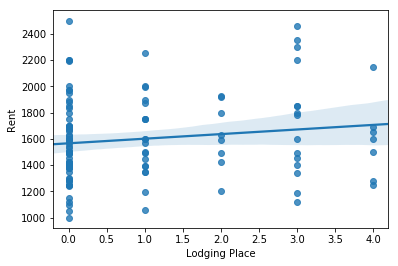

In [84]:
sns.regplot(x='Lodging Place',y='Rent',data=table)
table[['Lodging Place', 'Rent']].corr()

,Shop,Rent
Shop,1.000000,0.209611
Rent,0.209611,1.000000


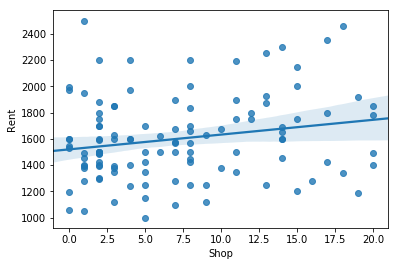

In [85]:
sns.regplot(x='Shop',y='Rent',data=table)
table[['Shop', 'Rent']].corr()

,Transport Spot,Rent
Transport Spot,1.000000,-0.118796
Rent,-0.118796,1.000000


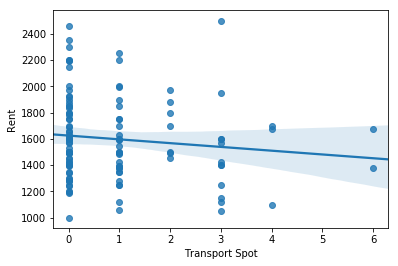

In [87]:
sns.regplot(x='Transport Spot',y='Rent',data=table)
table[['Transport Spot', 'Rent']].corr()

In [94]:
table.corr()

,Unnamed: 0,Size,Rooms,Furnished,Drink Place,Entertainment Place,Food Place,Lodging Place,Shop,Transport Spot,Rent
Unnamed: 0,1.000000,-0.018959,-0.087987,0.121822,0.009731,0.062464,0.041013,0.066937,-0.059784,-0.040880,-0.012386
Size,-0.018959,1.000000,0.685866,0.136187,0.024399,0.053347,0.065287,-0.059090,0.073393,-0.070552,0.595282
Rooms,-0.087987,0.685866,1.000000,0.163058,-0.234468,-0.223782,-0.195670,-0.225655,-0.186705,0.076129,0.320405
Furnished,0.121822,0.136187,0.163058,1.000000,-0.081608,-0.112189,-0.047399,-0.106125,-0.055722,0.017451,-0.123898
Drink Place,0.009731,0.024399,-0.234468,-0.081608,1.000000,0.905341,0.893286,0.805256,0.896142,-0.397523,0.239228
Entertainment Place,0.062464,0.053347,-0.223782,-0.112189,0.905341,1.000000,0.867730,0.728099,0.841420,-0.360668,0.298294
Food Place,0.041013,0.065287,-0.195670,-0.047399,0.893286,0.867730,1.000000,0.862344,0.861323,-0.381798,0.263411
Lodging Place,0.066937,-0.059090,-0.225655,-0.106125,0.805256,0.728099,0.862344,1.000000,0.704750,-0.404421,0.146148
Shop,-0.059784,0.073393,-0.186705,-0.055722,0.896142,0.841420,0.861323,0.704750,1.000000,-0.310542,0.209611
Transport Spot,-0.040880,-0.070552,0.076129,0.017451,-0.397523,-0.360668,-0.381798,-0.404421,-0.310542,1.000000,-0.118796


MODEL DEVELOPMENT

In [4]:
table = table.drop(table[table.Rent > 2500].index)
table = table.drop(table[table.Rent < 1000].index)
table.head()

,Unnamed: 0,Street,Size,Rooms,Furnished,Drink Place,Entertainment Place,Food Place,Lodging Place,Shop,Transport Spot,Rent
0,0,2e Buurkerksteeg,110,2,1,18,10,41,3,20,0,1850
1,1,3e Buurkerksteeg,77,1,0,18,11,42,3,18,0,1340
2,2,Abstederdijk,75,2,0,6,7,6,0,9,0,1250
3,3,Achter St.-Pieter,50,1,0,19,13,40,3,18,0,2457
4,4,Adelaarstraat,75,2,0,0,2,5,1,1,1,1495


In [23]:
table.shape

(116, 12)

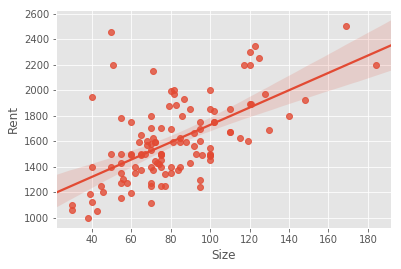

In [67]:
sns.regplot(x='Size',y='Rent',data=table)

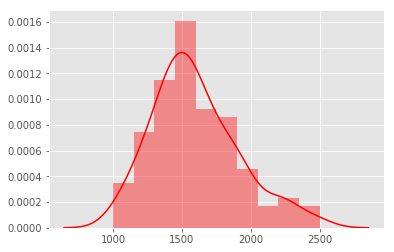

In [29]:
lm=LinearRegression()
Z=table[['Size']]
y=table[['Rent']]
lm.fit(Z,y)
yhat=lm.predict(Z)
sns.distplot(y,hist=True,color='r')

MODEL DEVELOPMENT

In [13]:
%%capture
! pip install ipywidgets

In [14]:
from IPython.display import display
from IPython.html import widgets 
from IPython.display import display
from ipywidgets import interact, interactive, fixed, interact_manual

In [2]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.model_selection import cross_val_score

from sklearn.linear_model import Ridge

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

MODEL DEVELOPMENT

In [3]:
def DistributionPlot(RedFunction, BlueFunction, RedName, BlueName, Title):
    width = 12
    height = 10
    plt.figure(figsize=(width, height))

    ax1 = sns.distplot(RedFunction, hist=False, color="r", label=RedName)
    ax2 = sns.distplot(BlueFunction, hist=False, color="b", label=BlueName, ax=ax1)

    plt.title(Title)
    plt.xlabel('Price (in dollars)')
    plt.ylabel('Proportion of Cars')

    plt.show()
    plt.close()

In [4]:
Input=[('scale',StandardScaler()), ('polynomial', PolynomialFeatures(include_bias=False)), ('model',LinearRegression())]

In [ ]:
table=pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/table.csv")
table = table.drop(table[table.Rent > 2500].index)
table = table.drop(table[table.Rent < 1000].index)

x_data=table[['Size','Rooms','Furnished','Drink Place','Entertainment Place','Food Place','Lodging Place','Shop','Transport Spot']]
y_data=table[['Rent']]

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/base.py:467: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, y, **fit_params).transform(X)
/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/pipeline.py:331: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


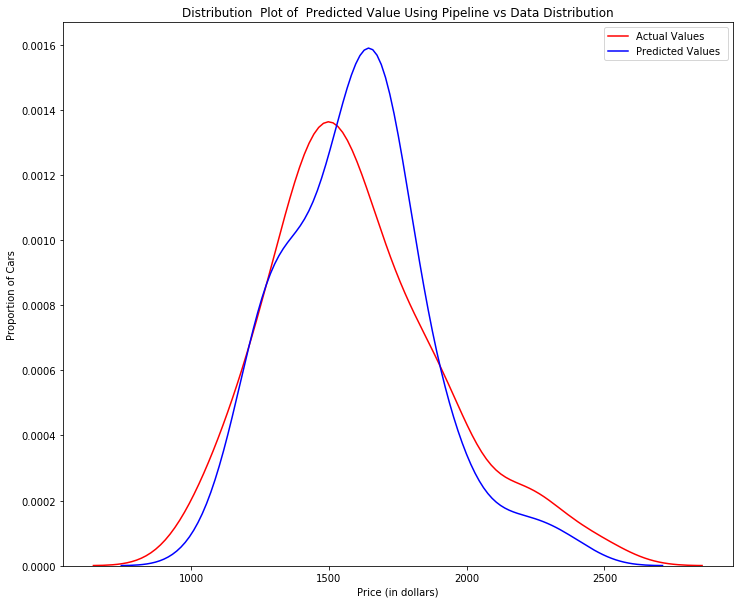

The R-square is:  0.7009869269041975


/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/pipeline.py:511: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


In [81]:
pipe=Pipeline(Input)
pipe

pipe.fit(x_data,y_data)

ypipe=pipe.predict(x_data)

Title = 'Distribution  Plot of  Predicted Value Using Pipeline vs Data Distribution'
DistributionPlot(y_data, ypipe, "Actual Values", "Predicted Values ", Title)

print('The R-square is: ', pipe.score(x_data,y_data))

In [83]:
pipe

Pipeline(memory=None,
     steps=[('scale', StandardScaler(copy=True, with_mean=True, with_std=True)), ('polynomial', PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)), ('model', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False))])

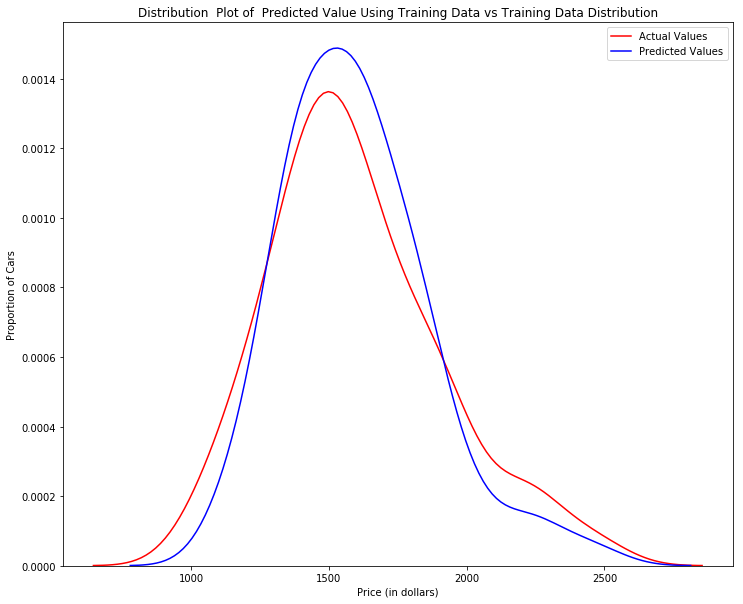

The R-square is:  0.5271371774580098


In [82]:
n=2
Rsqu=[]
lr=LinearRegression()
pr=PolynomialFeatures(degree=n)
x_pr= pr.fit_transform(x_data)
lr.fit(x_pr,y_data)
Rsqu.append(lr.score(x_pr,y_data))

Yhat=lr.predict(x_pr)


Title = 'Distribution  Plot of  Predicted Value Using Training Data vs Training Data Distribution'
DistributionPlot(y_data, Yhat, "Actual Values", "Predicted Values", Title)

print('The R-square is: ', lr.score(x_pr,y_data))

MODEL EVALUATION

In [5]:
def PollyPlot(xtrain, xtest, y_train, y_test, lr,poly_transform):
    width = 12
    height = 10
    plt.figure(figsize=(width, height))
    
    
    #training data 
    #testing data 
    # lr:  linear regression object 
    #poly_transform:  polynomial transformation object 
 
    xmax=max([xtrain.values.max(), xtest.values.max()])

    xmin=min([xtrain.values.min(), xtest.values.min()])

    x=np.arange(xmin, xmax, 0.1)


    plt.plot(xtrain, y_train, 'ro', label='Training Data')
    plt.plot(xtest, y_test, 'go', label='Test Data')
    plt.plot(x, lr.predict(poly_transform.fit_transform(x.reshape(-1, 1))), label='Predicted Function')
    plt.ylim([-10000, 60000])
    plt.ylabel('Price')
    plt.legend()

In [6]:
table=pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/table.csv")
table = table.drop(table[table.Rent > 2500].index)
table = table.drop(table[table.Rent < 1000].index)

x_data=table[['Size','Rooms','Furnished','Drink Place','Entertainment Place','Food Place','Lodging Place','Shop','Transport Spot']]
y_data=table[['Rent']]

x_train,x_test,y_train,y_test = train_test_split(x_data,y_data,test_size=0.3,random_state=0)
lr=LinearRegression()

Cross Validation Score evaluation for the dataset

In [102]:
x_data=table[['Size','Entertainment Place']]
y_data=table[['Rent']]

lre_=LinearRegression()

Rcross = cross_val_score(lre_, x_data, y_data, cv=4)
print("The mean of the folds are", Rcross.mean(), "and the standard deviation is" , Rcross.std())
Rcross

The mean of the folds are 0.394877898683804 and the standard deviation is 0.10106104571941554


array([0.26914406, 0.54988425, 0.39740165, 0.36308163])

The R-square test is:  [0.26734780069991326, 0.2180597586549654, 0.07114187741892974]
The R-square train is:  [0.48810420790798015, 0.5043464232160804, 0.5711362111594616]


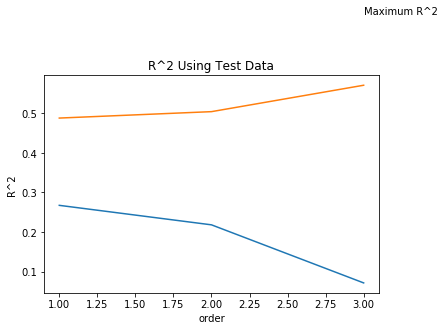

In [104]:
table = pd.read_csv("https://raw.githubusercontent.com/umbesallfi/Coursera_Capstone/master/table.csv")
table = table.drop(table[table.Rent > 2500].index)
table = table.drop(table[table.Rent < 1000].index)

#x_data=table[['Size','Rooms','Furnished','Drink Place','Entertainment Place','Food Place','Lodging Place','Shop','Transport Spot']]
y_data=table[['Rent']]

x_train,x_test,y_train,y_test = train_test_split(x_data,y_data,test_size=0.3,random_state=0)
lr=LinearRegression()

Rsqu_test=[]
Rsqu_train=[]
order = [1,2,3]
#n=1
for n in order:
    pr=PolynomialFeatures(degree=n)
    x_train_pr= pr.fit_transform(x_train)
    x_test_pr= pr.fit_transform(x_test)
    lr.fit(x_train_pr,y_train)
    Rsqu_test.append(lr.score(x_test_pr,y_test))
    Rsqu_train.append(lr.score(x_train_pr,y_train))
    #sns.regplot(x=x_train_pr,y=y_train,data=table)
    
plt.plot(order, Rsqu_test)
plt.plot(order, Rsqu_train)
plt.xlabel('order')
plt.ylabel('R^2')
plt.title('R^2 Using Test Data')
plt.text(3, 0.75, 'Maximum R^2 ') 

print('The R-square test is: ', Rsqu_test)
print('The R-square train is: ', Rsqu_train)

In [105]:
n=1
lr=LinearRegression()
pr=PolynomialFeatures(degree=n)
x_train_pr= pr.fit_transform(x_train)
x_test_pr= pr.fit_transform(x_test)
lr.fit(x_train_pr,y_train)
Rsqu_test.append(lr.score(x_test_pr,y_test))

Yhat_train=lr.predict(x_train_pr)
Yhat_test=lr.predict(x_test_pr) 

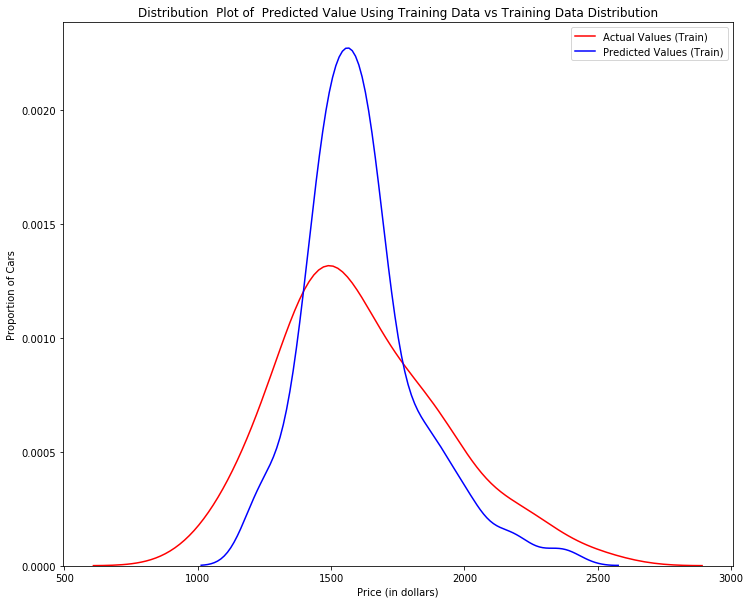

In [106]:
Title = 'Distribution  Plot of  Predicted Value Using Training Data vs Training Data Distribution'
DistributionPlot(y_train, Yhat_train, "Actual Values (Train)", "Predicted Values (Train)", Title)

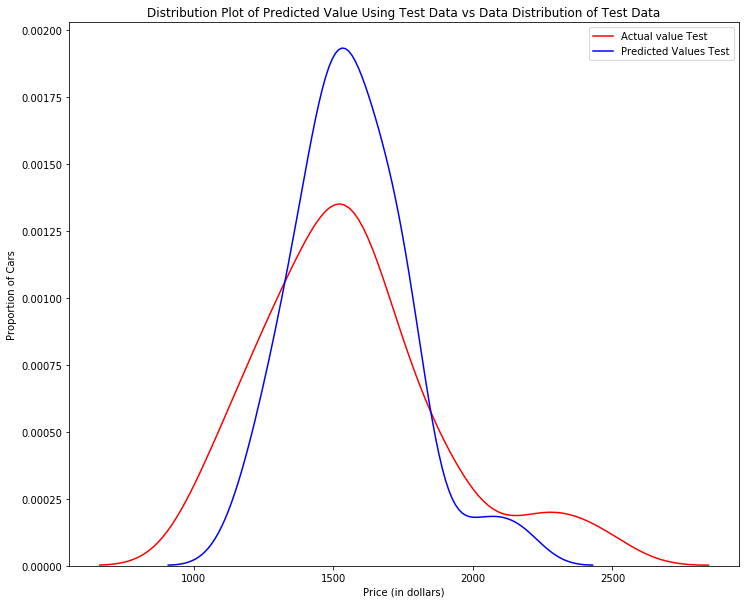

In [107]:
Title="Distribution Plot of Predicted Value Using Test Data vs Data Distribution of Test Data"
DistributionPlot(y_test,Yhat_test,"Actual value Test","Predicted Values Test", Title)

Ridge Model

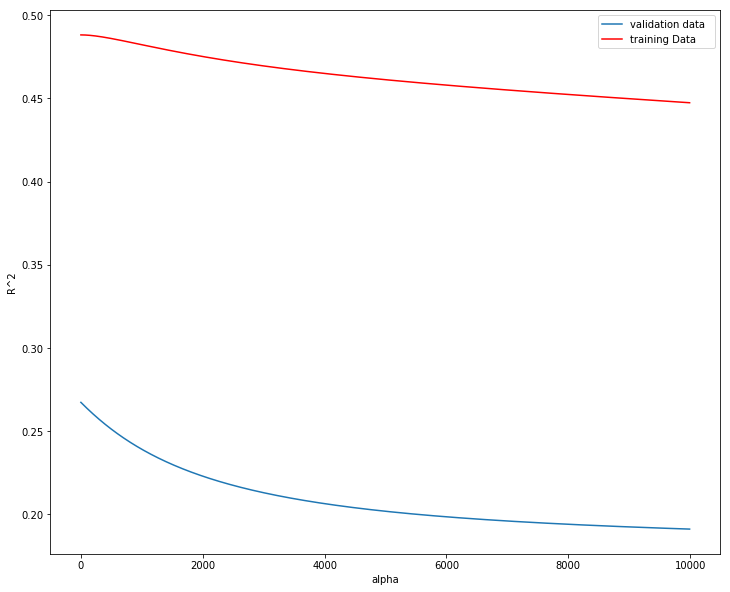

In [113]:
n=1
lr=LinearRegression()
pr=PolynomialFeatures(degree=n)
x_train_pr= pr.fit_transform(x_train)
x_test_pr= pr.fit_transform(x_test)
lr.fit(x_train_pr,y_train)
Rsqu_test.append(lr.score(x_test_pr,y_test))

Yhat_train=lr.predict(x_train_pr)
Yhat_test=lr.predict(x_test_pr) 

RigeModel=Ridge(alpha=0.1)
RigeModel.fit(x_train_pr, y_train)
yhat = RigeModel.predict(x_test_pr)


Rsqu__test = []
Rsqu__train = []
dummy1 = []
ALFA = 10 * np.array(range(0,1000))
for alfa in ALFA:
    RigeModel = Ridge(alpha=alfa) 
    RigeModel.fit(x_train, y_train)
    Rsqu__test.append(RigeModel.score(x_test, y_test))
    Rsqu__train.append(RigeModel.score(x_train, y_train))
    
width = 12
height = 10
plt.figure(figsize=(width, height))

plt.plot(ALFA,Rsqu__test, label='validation data  ')
plt.plot(ALFA,Rsqu__train, 'r', label='training Data ')
plt.xlabel('alpha')
plt.ylabel('R^2')
plt.legend()

#print('Alpha value is: ', ALFA)
#print('The R-square test is: ', Rsqu__test)
#alpha=1 n=1